In [114]:
import numpy as np
import matplotlib.pyplot as plt

from tqdm import tqdm
import sklearn.metrics as metrics

from keras.models import Model, load_model
from keras.layers import Input, Softmax
from keras.layers.core import Dropout, Lambda
from keras.layers.convolutional import Conv2D, Conv2DTranspose
from keras.layers.pooling import MaxPooling2D
from keras.layers.merge import concatenate
from keras.callbacks import EarlyStopping, ModelCheckpoint
from keras.layers import UpSampling2D

### Note: Please go through the Section E before running the notebook sequentially. This is because in Section E, we have visualizations that are manually selected after looking at various images to choose the visually good and bad segmentations.

# A) Extracting Train (with Random Patches) & Test Sets from Dataset

In [115]:
import os
from cv2 import imread

X_train, Y_train = [], []
X_test, Y_test = [], []


files = os.listdir('dataset')

# The filenames are same in the dataset and the labels folder
for file in files:
    # Filenames starting with odd numbers goes to train & even numbers goes to test sets
    if int(file.split('-')[1]) % 2 == 1:
        X_train.append((imread('dataset/'+file, 0)/255).reshape(500, 500, 1))
        yt = imread('labels/'+file, 0)
        yt1 = np.zeros([500, 500, 2], dtype=np.float_)
        # Assigning cell borders and cell interior to channel 0 and 1 respectively
        yt1[:,:,0] = yt == 1
        yt1[:,:,1] = yt == 2
        Y_train.append(yt1)
    else:
        X_test.append((imread('dataset/'+file, 0)/255).reshape(500, 500, 1))
        yt = imread('labels/'+file, 0)
        yt1 = np.zeros([500, 500, 2], dtype=np.float_)
        yt1[:,:,0] = yt == 1
        yt1[:,:,1] = yt == 2
        Y_test.append(yt1)

In [116]:
# Function to get the random patches which contains atleast 50% of the cell pixels within them (as in the given labels)
def get_random_patches(X_images, Y_images):
    X_patches = []
    Y_patches = []
    for X_image, Y_image in tqdm(zip(X_images, Y_images), total=len(X_images)):
        n_patches = 0
        while n_patches < 200:
            # Generate random patches until the target of 200 patches is reaches, with all od them containing >= 50% cell pixels
            x = np.random.randint(468)  # 512 - 32
            y = np.random.randint(468)
            y_image = Y_image[x:x + 32, y:y + 32]

            if np.sum(y_image) >= 512:
                X_patches.append(X_image[x:x + 32, y:y + 32])
                Y_patches.append(y_image)
                n_patches += 1
    return np.array(X_patches), np.array(Y_patches)

In [117]:
# Getting Random Patches
X_train, Y_train = get_random_patches(X_train, Y_train)

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 87/87 [00:00<00:00, 114.78it/s]


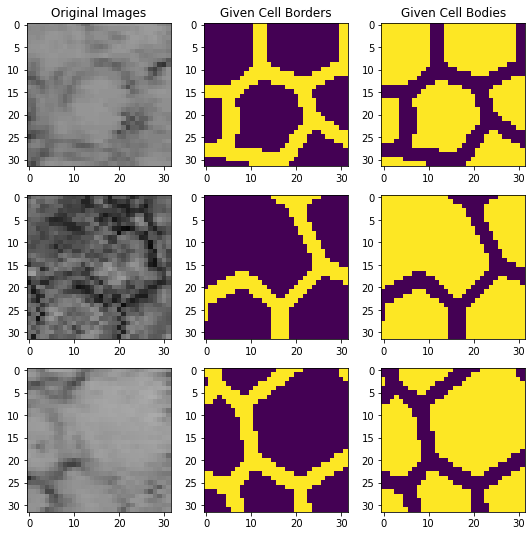

In [118]:
# Displaying a sample of the generated Random Patches from the training set
plt.figure(figsize=(9,9))
for i in range(3):
    r_int = np.random.randint(17400)
    plt.subplot(3,3,i*3+1)
    if i == 0: plt.title('Original Images')
    plt.imshow(X_train[r_int].reshape(32,32), cmap='gray', vmin=0, vmax=1)
    plt.subplot(3,3,i*3+2)
    if i == 0: plt.title('Given Cell Borders')
    plt.imshow(Y_train[r_int][:,:,0].reshape(32,32), interpolation='nearest')
    plt.subplot(3,3,i*3+3)
    if i == 0: plt.title('Given Cell Bodies')
    plt.imshow(Y_train[r_int][:,:,1].reshape(32,32), interpolation='nearest')
plt.show()

In [119]:
# Getting Random Patches on test set to use it as validation data
X_test_patches, Y_test_patches = get_random_patches(X_test, Y_test)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 73/73 [00:00<00:00, 96.05it/s]


# B) Building the Model in Paper

In [120]:
# Building the model

in1 = Input((32, 32,1))
print(in1)

conv1 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(in1)
conv1 = Dropout(0.1)(conv1)
conv1 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(conv1)

pool1 = MaxPooling2D((2, 2), strides=(2, 2))(conv1)
conv2 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(pool1)
conv2 = Dropout(0.1)(conv2)
conv2 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(conv2)

pool2 = MaxPooling2D((2, 2), strides=(2, 2))(conv2)
conv3 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(pool2)
conv3 = Dropout(0.1)(conv3)
conv3 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(conv3)


up1 = concatenate([UpSampling2D((2, 2))(conv3), conv2], axis=-1)
conv4 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(up1)
conv4 = Dropout(0.1)(conv4)
conv4 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(conv4)


up2 = concatenate([UpSampling2D((2, 2))(conv4), conv1], axis=-1)
conv5 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(up2)
conv5 = Dropout(0.1)(conv5)
conv5 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(conv5)
conv5 = Conv2D(2, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(conv5)

segmentation = Softmax()(conv5)

# segmentation = Conv2D(2, (3, 3), activation='softmax', kernel_initializer='he_normal', padding='same', name='seg')(conv5)

# unet_model=tf.keras.Model(in1, segmentation, name="U-Net")
#losses = {'seg': 'categorical_crossentropy'}
#metrics = {'seg': ['acc'] }

model = Model(inputs=[in1], outputs=[segmentation], name="U-Net")
# optimizer = keras.optimizers.Adam(lr=0.00001)
model.compile(optimizer='adam', loss = 'categorical_crossentropy', metrics=['accuracy'])

model.summary()

Tensor("input_5:0", shape=(None, 32, 32, 1), dtype=float32)
Model: "U-Net"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_5 (InputLayer)            (None, 32, 32, 1)    0                                            
__________________________________________________________________________________________________
conv2d_45 (Conv2D)              (None, 32, 32, 32)   320         input_5[0][0]                    
__________________________________________________________________________________________________
dropout_21 (Dropout)            (None, 32, 32, 32)   0           conv2d_45[0][0]                  
__________________________________________________________________________________________________
conv2d_46 (Conv2D)              (None, 32, 32, 32)   9248        dropout_21[0][0]                 
__________________________________

# C) Training the Model

In [121]:
model_name = "models/"+"Unet_black_background.h5"

modelcheckpoint = ModelCheckpoint(model_name, monitor='val_loss', mode='auto', verbose=1, save_best_only=True)

# lr_callback = ReduceLROnPlateau(min_lr=0.000001)
# callback_list = [modelcheckpoint, lr_callback]

callback_list = [modelcheckpoint]

# history = 

model.fit(
    X_train,
    Y_train,
    epochs=150,
    batch_size = 32,
    validation_data=(X_test_patches, Y_test_patches),
    verbose=2, 
    shuffle=False,
    callbacks = callback_list
)

Train on 17400 samples, validate on 14600 samples
Epoch 1/150
 - 11s - loss: 0.4464 - accuracy: 0.6821 - val_loss: 0.3941 - val_accuracy: 0.7193

Epoch 00001: val_loss improved from inf to 0.39411, saving model to models/Unet_black_background.h5
Epoch 2/150
 - 12s - loss: 0.3911 - accuracy: 0.7195 - val_loss: 0.3886 - val_accuracy: 0.7258

Epoch 00002: val_loss improved from 0.39411 to 0.38861, saving model to models/Unet_black_background.h5
Epoch 3/150
 - 12s - loss: 0.3796 - accuracy: 0.7269 - val_loss: 0.3820 - val_accuracy: 0.7317

Epoch 00003: val_loss improved from 0.38861 to 0.38204, saving model to models/Unet_black_background.h5
Epoch 4/150
 - 12s - loss: 0.3734 - accuracy: 0.7313 - val_loss: 0.3769 - val_accuracy: 0.7380

Epoch 00004: val_loss improved from 0.38204 to 0.37686, saving model to models/Unet_black_background.h5
Epoch 5/150
 - 11s - loss: 0.3691 - accuracy: 0.7338 - val_loss: 0.3748 - val_accuracy: 0.7396

Epoch 00005: val_loss improved from 0.37686 to 0.37485, sa


Epoch 00053: val_loss did not improve from 0.37015
Epoch 54/150
 - 16s - loss: 0.2978 - accuracy: 0.7803 - val_loss: 0.4243 - val_accuracy: 0.7314

Epoch 00054: val_loss did not improve from 0.37015
Epoch 55/150
 - 12s - loss: 0.2975 - accuracy: 0.7801 - val_loss: 0.4239 - val_accuracy: 0.7327

Epoch 00055: val_loss did not improve from 0.37015
Epoch 56/150
 - 16s - loss: 0.2966 - accuracy: 0.7807 - val_loss: 0.4256 - val_accuracy: 0.7316

Epoch 00056: val_loss did not improve from 0.37015
Epoch 57/150
 - 24s - loss: 0.2959 - accuracy: 0.7811 - val_loss: 0.4326 - val_accuracy: 0.7308

Epoch 00057: val_loss did not improve from 0.37015
Epoch 58/150
 - 15s - loss: 0.2956 - accuracy: 0.7810 - val_loss: 0.4347 - val_accuracy: 0.7312

Epoch 00058: val_loss did not improve from 0.37015
Epoch 59/150
 - 15s - loss: 0.2952 - accuracy: 0.7815 - val_loss: 0.4256 - val_accuracy: 0.7311

Epoch 00059: val_loss did not improve from 0.37015
Epoch 60/150
 - 15s - loss: 0.2951 - accuracy: 0.7813 - val_

 - 15s - loss: 0.2726 - accuracy: 0.7938 - val_loss: 0.4306 - val_accuracy: 0.7271

Epoch 00109: val_loss did not improve from 0.37015
Epoch 110/150
 - 15s - loss: 0.2725 - accuracy: 0.7940 - val_loss: 0.4431 - val_accuracy: 0.7267

Epoch 00110: val_loss did not improve from 0.37015
Epoch 111/150
 - 15s - loss: 0.2732 - accuracy: 0.7934 - val_loss: 0.4338 - val_accuracy: 0.7276

Epoch 00111: val_loss did not improve from 0.37015
Epoch 112/150
 - 15s - loss: 0.2730 - accuracy: 0.7935 - val_loss: 0.4383 - val_accuracy: 0.7260

Epoch 00112: val_loss did not improve from 0.37015
Epoch 113/150
 - 15s - loss: 0.2724 - accuracy: 0.7942 - val_loss: 0.4384 - val_accuracy: 0.7273

Epoch 00113: val_loss did not improve from 0.37015
Epoch 114/150
 - 15s - loss: 0.2722 - accuracy: 0.7938 - val_loss: 0.4345 - val_accuracy: 0.7260

Epoch 00114: val_loss did not improve from 0.37015
Epoch 115/150
 - 15s - loss: 0.2723 - accuracy: 0.7944 - val_loss: 0.4432 - val_accuracy: 0.7265

Epoch 00115: val_loss 

## Raw Output of Trained model on random patches on Test Set

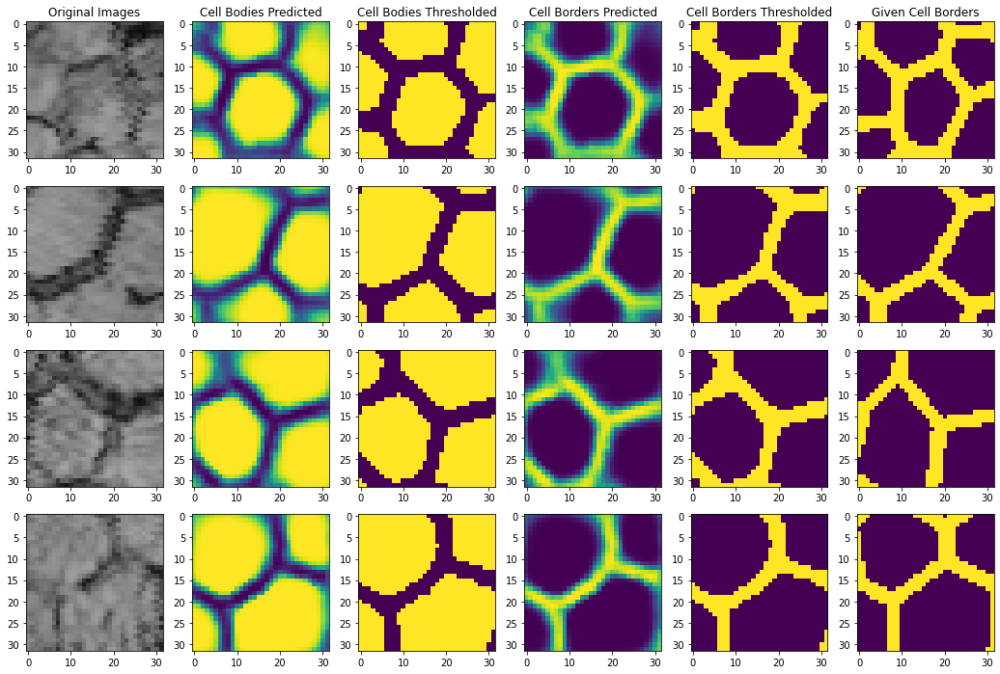

In [122]:
plt.figure(figsize=(18,12))
for i in range(4):
    r_int = np.random.randint(14600)
    plt.subplot(4,6,i*6+1)
    if i == 0: plt.title('Original Images')
    plt.imshow(X_test_patches[r_int][:,:,0].reshape(32,32), cmap='gray', vmin=0, vmax=1)
    plt.subplot(4,6,i*6+2)
    if i == 0: plt.title('Cell Bodies Predicted')
    plt.imshow(model.predict(np.array([X_test_patches[r_int]]))[0,:,:,1].reshape(32,32), interpolation='nearest')
    plt.subplot(4,6,i*6+3)
    if i == 0: plt.title('Cell Bodies Thresholded')
    plt.imshow(model.predict(np.array([X_test_patches[r_int]]))[0,:,:,1].reshape(32,32)>0.5, interpolation='nearest')
    plt.subplot(4,6,i*6+4)
    if i == 0: plt.title('Cell Borders Predicted')
    plt.imshow(model.predict(np.array([X_test_patches[r_int]]))[0,:,:,0].reshape(32,32), interpolation='nearest')
    plt.subplot(4,6,i*6+5)
    if i == 0: plt.title('Cell Borders Thresholded')
    plt.imshow(model.predict(np.array([X_test_patches[r_int]]))[0,:,:,0].reshape(32,32)>0.5, interpolation='nearest')
    plt.subplot(4,6,i*6+6)
    if i == 0: plt.title('Given Cell Borders')
    plt.imshow(Y_test_patches[r_int][:,:,0].reshape(32,32), interpolation='nearest')
plt.show()

# D) Applying methods in section 3.3 & 3.4, on predicted test images

## (i) Applying 3.3

In [123]:
# Applying 3.3 i.e sliding window on test dataset

div_mat = np.zeros((525, 525, 2), dtype=np.int_)
for x in range(0, 500, 29):
        for y in range(0, 500, 29):
            div_mat[x:x+32, y:y+32] += 1
div_mat = div_mat[:500, :500]

Y_pred = []
for image in X_test:
    # Padding image at the rightside bottom, so that it is divisible by the 32x32 window with a stride of 29
    img = np.zeros((525, 525, 1), dtype=np.float_)
    img[:500, :500, :] = image
    
    # Collecting 32x32 patches from the dataset to pass them into the model, and get their predictions
    patches = []
    for x in range(0, 500, 29):
        for y in range(0, 500, 29):
            patches.append(img[x:x+32, y:y+32])
    
    preds = model.predict(np.array(patches))
    
    # Consruction a 500x500 image using the set of 32x32 predictions 
    pred = np.zeros((525, 525, 2), dtype=np.float_)
    i = 0
    for x in range(0, 500, 29):
        for y in range(0, 500, 29):
            pred[x:x+32, y:y+32] += preds[i]
            i += 1
    pred = pred[:500, :500] / div_mat
    
    Y_pred.append(pred)

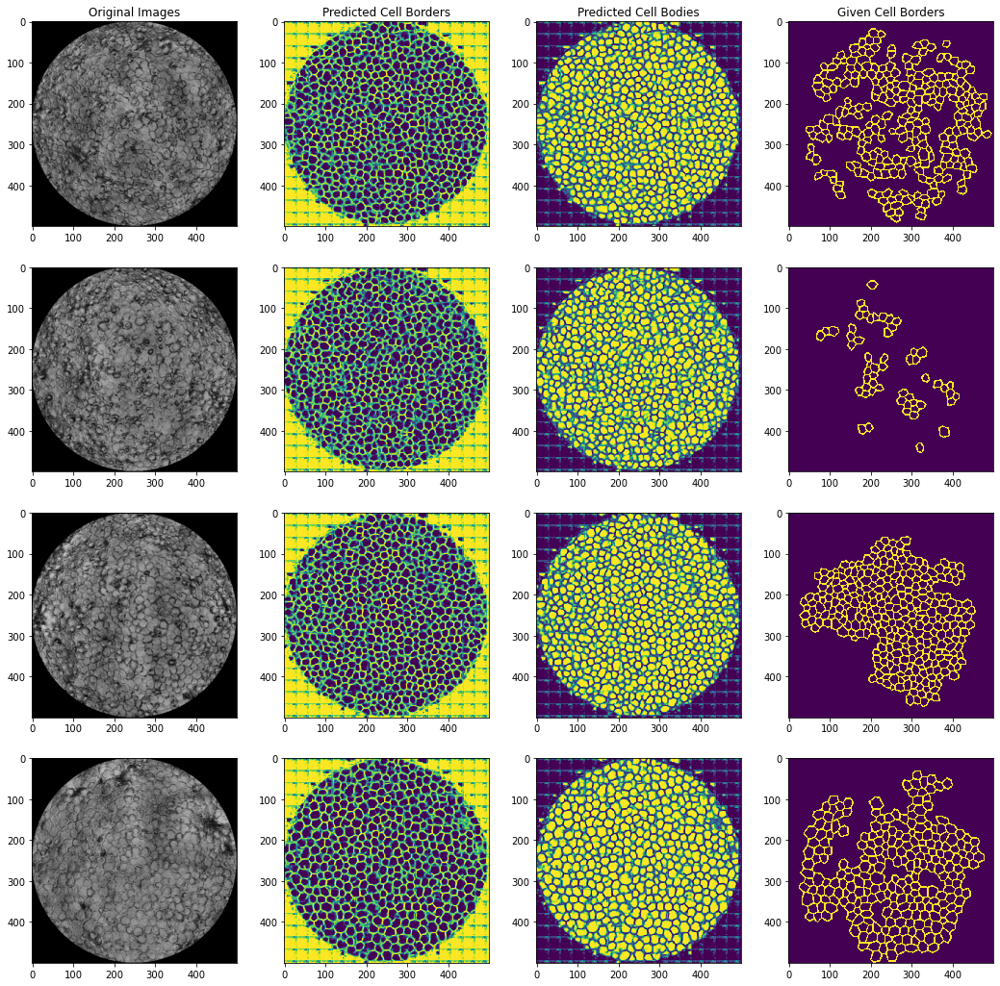

In [124]:
# Visualizing the Output of 3.3 Method

plt.figure(figsize=(18,18))
for i in range(4):
    r_int = np.random.randint(71)
    plt.subplot(4,4,i*4+1)
    if i == 0: plt.title('Original Images')
    plt.imshow(X_test[r_int].reshape(500,500), cmap='gray', vmin=0, vmax=1)
    plt.subplot(4,4,i*4+2)
    if i == 0: plt.title('Predicted Cell Borders')
    plt.imshow(Y_pred[r_int][:,:,0].reshape(500,500), interpolation='nearest')
    plt.subplot(4,4,i*4+3)
    if i == 0: plt.title('Predicted Cell Bodies')
    plt.imshow(Y_pred[r_int][:,:,1].reshape(500,500), interpolation='nearest')
    plt.subplot(4,4,i*4+4)
    if i == 0: plt.title('Given Cell Borders')
    plt.imshow(Y_test[r_int][:,:,0].reshape(500,500), interpolation='nearest')
plt.show()

# (ii) Applying 3.4

In [125]:
window = [5, 5]
padding = 'replicate'
def avg_filter(img):
    pad_image = np.zeros((505,505,2), dtype=np.float_)
    pad_image[3:503, 3:503] = img
    
    cs = np.cumsum(np.cumsum(pad_image, 0), 1)  
    image = cs[5:505, 5:505] + cs[:500, :500] - cs[5:505, :500] - cs[:500, 5:505]
    image /= 25    # Dividing by the number of cells (5x5) since each pixel contains sum of window, but we want average
    
    return image

Y_post = []
for image in tqdm(Y_pred):
    mean_mat = avg_filter(image)
    
    # To find Standarrd Deviation
    mean_sq = avg_filter(image**2)  # Mean of square
    std_mat = (np.abs(mean_sq-(mean_mat**2)))**0.5   # Standard Devation
    
    std_max = np.zeros((500, 500, 2), dtype=np.float_)
    std_max[:,:,0], std_max[:,:,1] = np.max(std_mat[:,:,0]), np.max(std_mat[:,:,1])  # Max of Standard Deviation
    thresh = mean_mat*(1+0.2*(std_mat/std_max-1))  # The final formula as described in the paper in 3.4
    
    Y_post.append(image > thresh)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 73/73 [00:04<00:00, 17.85it/s]


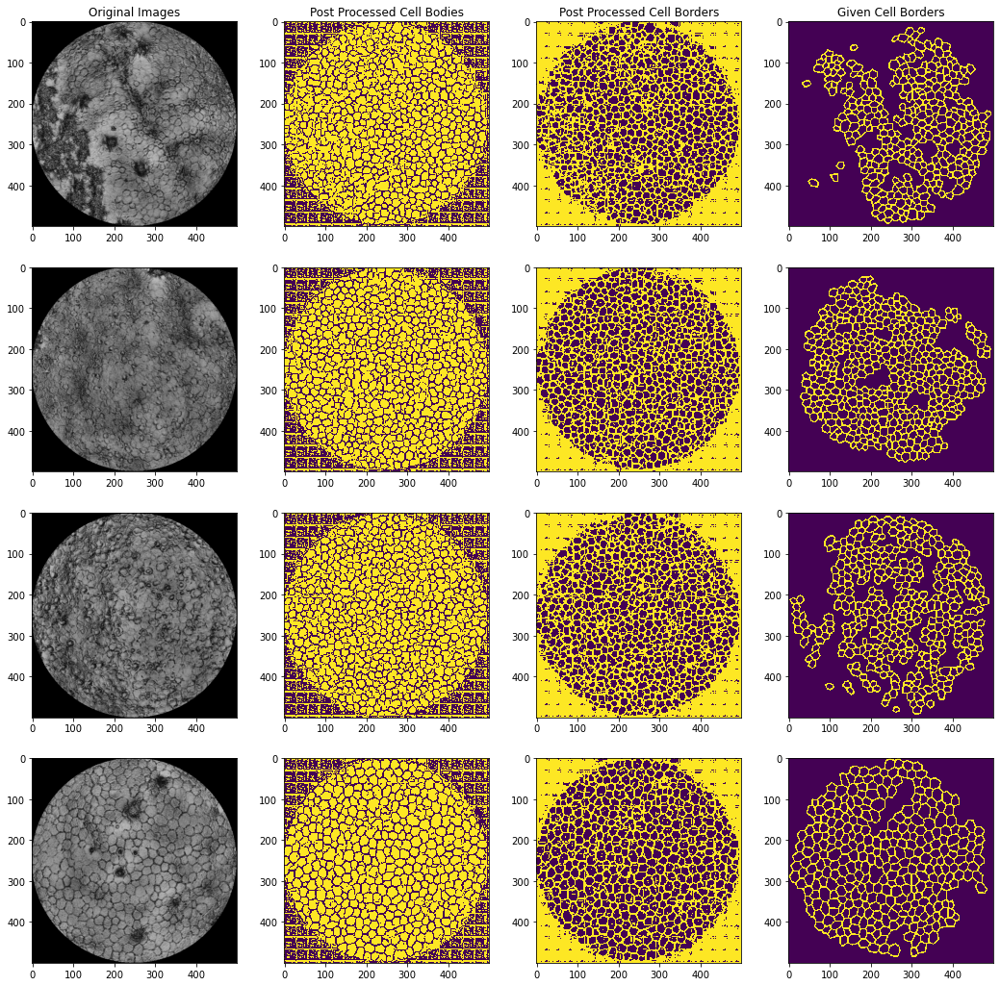

In [126]:
plt.figure(figsize=(18,18))
for i in range(4):
    r_int = np.random.randint(71)
    plt.subplot(4,4,i*4+1)
    if i == 0: plt.title('Original Images')
    plt.imshow(X_test[r_int].reshape(500,500), cmap='gray', vmin=0, vmax=1)
    plt.subplot(4,4,i*4+2)
    if i == 0: plt.title('Post Processed Cell Bodies')
    plt.imshow(Y_post[r_int][:,:,1].reshape(500,500), interpolation='nearest')
    plt.subplot(4,4,i*4+3)
    if i == 0: plt.title('Post Processed Cell Borders')
    plt.imshow(Y_post[r_int][:,:,0].reshape(500,500), interpolation='nearest')
    plt.subplot(4,4,i*4+4)
    if i == 0: plt.title('Given Cell Borders')
    plt.imshow(Y_test[r_int][:,:,0].reshape(500,500), interpolation='nearest')
plt.show()

# E) Selection of Good & Bad Segmentations

## (i) Predicted Patches:

### Good Patches:

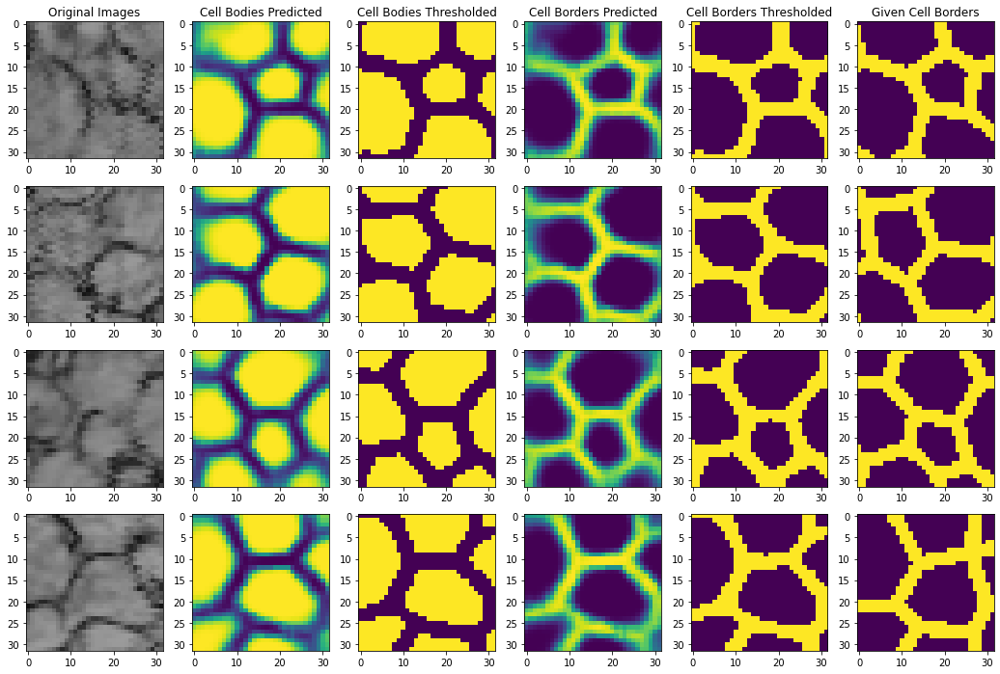

In [218]:
plt.figure(figsize=(18,12))
x = 16
good_patches = [13, 25, 35, 67]
for i in range(4):
    r_int = good_patches[i]
    plt.subplot(4,6,i*6+1)
    if i == 0: plt.title('Original Images')
    plt.imshow(X_test_patches[r_int][:,:,0].reshape(32,32), cmap='gray', vmin=0, vmax=1)
    plt.subplot(4,6,i*6+2)
    if i == 0: plt.title('Cell Bodies Predicted')
    plt.imshow(model.predict(np.array([X_test_patches[r_int]]))[0,:,:,1].reshape(32,32), interpolation='nearest')
    plt.subplot(4,6,i*6+3)
    if i == 0: plt.title('Cell Bodies Thresholded')
    plt.imshow(model.predict(np.array([X_test_patches[r_int]]))[0,:,:,1].reshape(32,32)>0.5, interpolation='nearest')
    plt.subplot(4,6,i*6+4)
    if i == 0: plt.title('Cell Borders Predicted')
    plt.imshow(model.predict(np.array([X_test_patches[r_int]]))[0,:,:,0].reshape(32,32), interpolation='nearest')
    plt.subplot(4,6,i*6+5)
    if i == 0: plt.title('Cell Borders Thresholded')
    plt.imshow(model.predict(np.array([X_test_patches[r_int]]))[0,:,:,0].reshape(32,32)>0.5, interpolation='nearest')
    plt.subplot(4,6,i*6+6)
    if i == 0: plt.title('Given Cell Borders')
    plt.imshow(Y_test_patches[r_int][:,:,0].reshape(32,32), interpolation='nearest')
plt.show()

### Bad Patches:

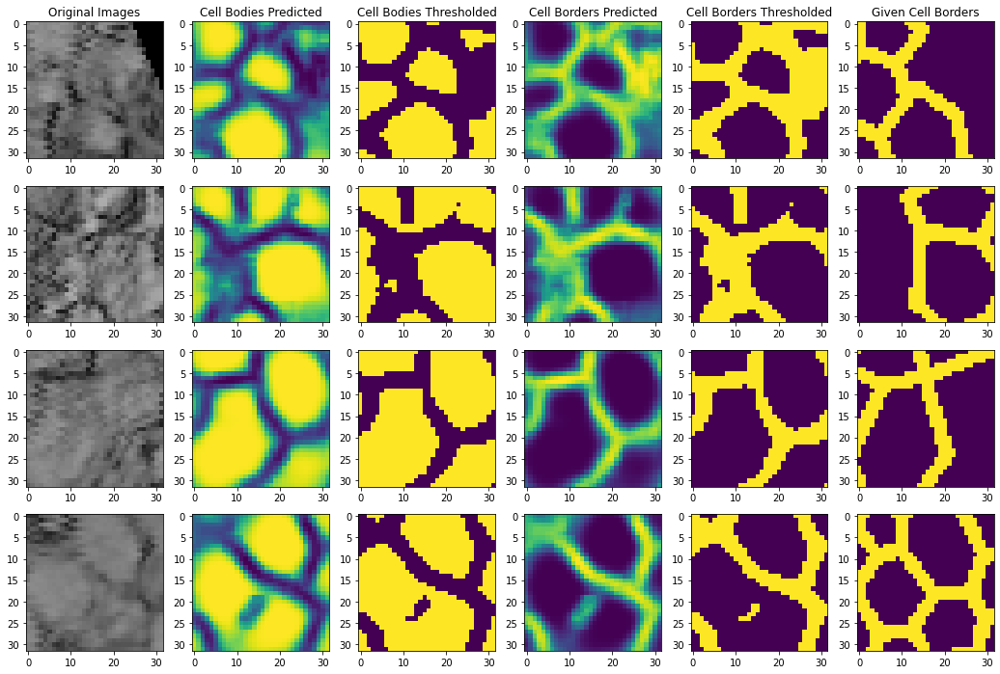

In [219]:
plt.figure(figsize=(18,12))
bad_patches = [4, 41, 45, 61]
for i in range(4):
    r_int = bad_patches[i]
    plt.subplot(4,6,i*6+1)
    if i == 0: plt.title('Original Images')
    plt.imshow(X_test_patches[r_int][:,:,0].reshape(32,32), cmap='gray', vmin=0, vmax=1)
    plt.subplot(4,6,i*6+2)
    if i == 0: plt.title('Cell Bodies Predicted')
    plt.imshow(model.predict(np.array([X_test_patches[r_int]]))[0,:,:,1].reshape(32,32), interpolation='nearest')
    plt.subplot(4,6,i*6+3)
    if i == 0: plt.title('Cell Bodies Thresholded')
    plt.imshow(model.predict(np.array([X_test_patches[r_int]]))[0,:,:,1].reshape(32,32)>0.5, interpolation='nearest')
    plt.subplot(4,6,i*6+4)
    if i == 0: plt.title('Cell Borders Predicted')
    plt.imshow(model.predict(np.array([X_test_patches[r_int]]))[0,:,:,0].reshape(32,32), interpolation='nearest')
    plt.subplot(4,6,i*6+5)
    if i == 0: plt.title('Cell Borders Thresholded')
    plt.imshow(model.predict(np.array([X_test_patches[r_int]]))[0,:,:,0].reshape(32,32)>0.5, interpolation='nearest')
    plt.subplot(4,6,i*6+6)
    if i == 0: plt.title('Given Cell Borders')
    plt.imshow(Y_test_patches[r_int][:,:,0].reshape(32,32), interpolation='nearest')
plt.show()

## (ii) Predicted Images (3.3 Applied):

### Good Predictions:

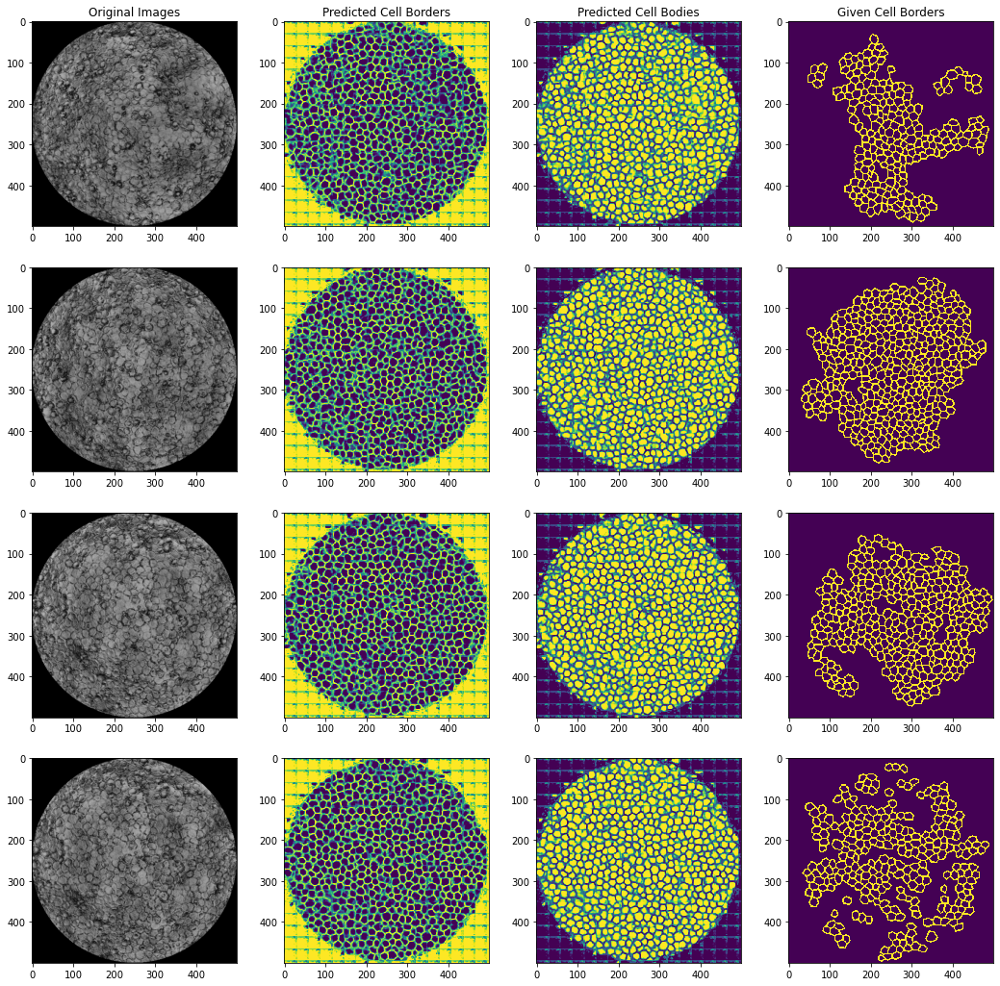

In [220]:
plt.figure(figsize=(18,18))
x = 10
good_preds = [22, 26, 38, 39]
for i in range(4):
    r_int = good_preds[i]
    plt.subplot(4,4,i*4+1)
    if i == 0: plt.title('Original Images')
    plt.imshow(X_test[r_int].reshape(500,500), cmap='gray', vmin=0, vmax=1)
    plt.subplot(4,4,i*4+2)
    if i == 0: plt.title('Predicted Cell Borders')
    plt.imshow(Y_pred[r_int][:,:,0].reshape(500,500), interpolation='nearest')
    plt.subplot(4,4,i*4+3)
    if i == 0: plt.title('Predicted Cell Bodies')
    plt.imshow(Y_pred[r_int][:,:,1].reshape(500,500), interpolation='nearest')
    plt.subplot(4,4,i*4+4)
    if i == 0: plt.title('Given Cell Borders')
    plt.imshow(Y_test[r_int][:,:,0].reshape(500,500), interpolation='nearest')
plt.show()

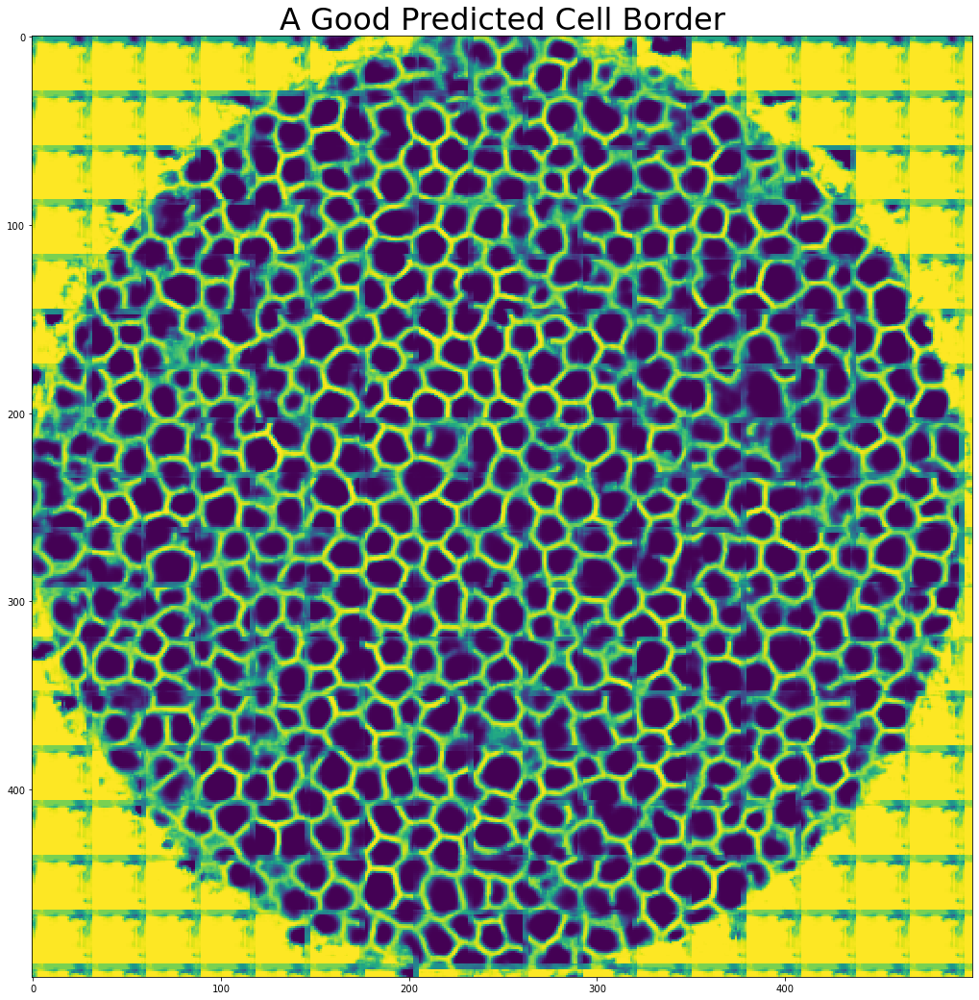

In [221]:
plt.figure(figsize=(18,18))
plt.title('A Good Predicted Cell Border', fontsize=32)
plt.imshow(Y_pred[22][:,:,0].reshape(500,500), interpolation='nearest')
plt.show()

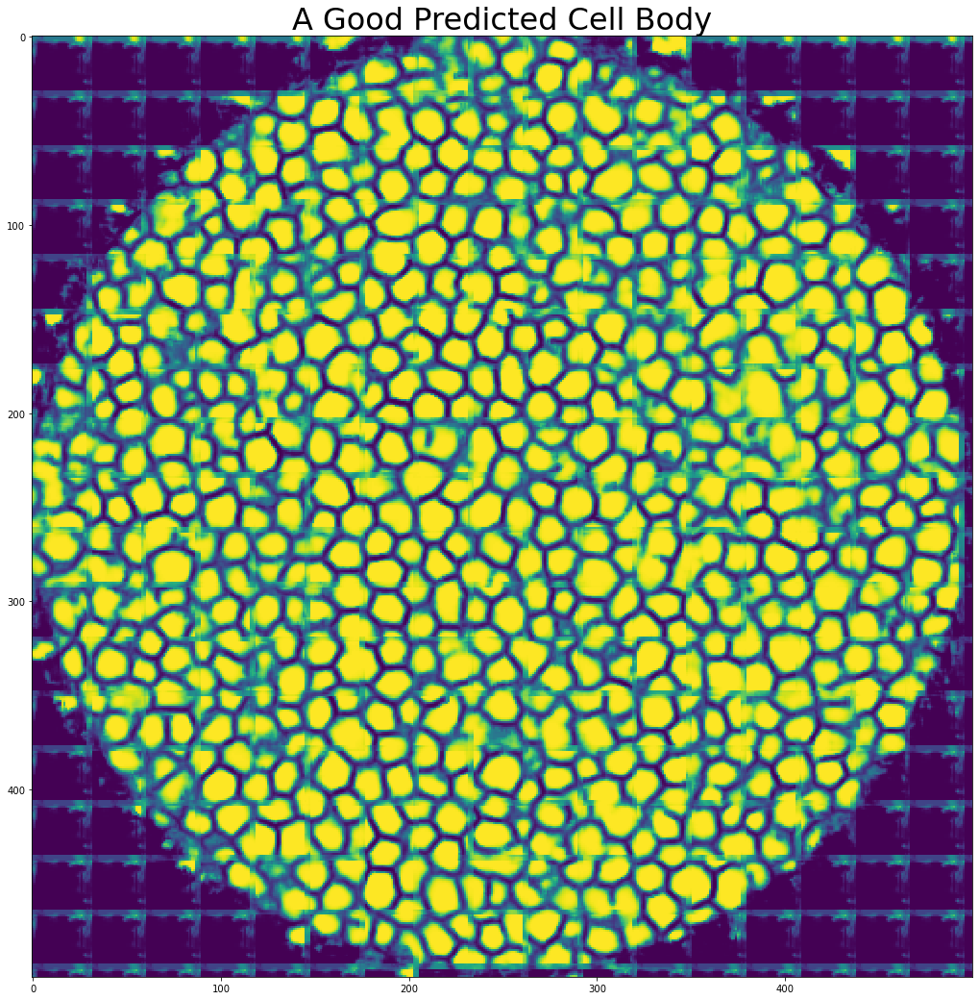

In [222]:
plt.figure(figsize=(18,18))
plt.title('A Good Predicted Cell Body', fontsize=32)
plt.imshow(Y_pred[22][:,:,1].reshape(500,500), interpolation='nearest')
plt.show()

### Bad Predictions:

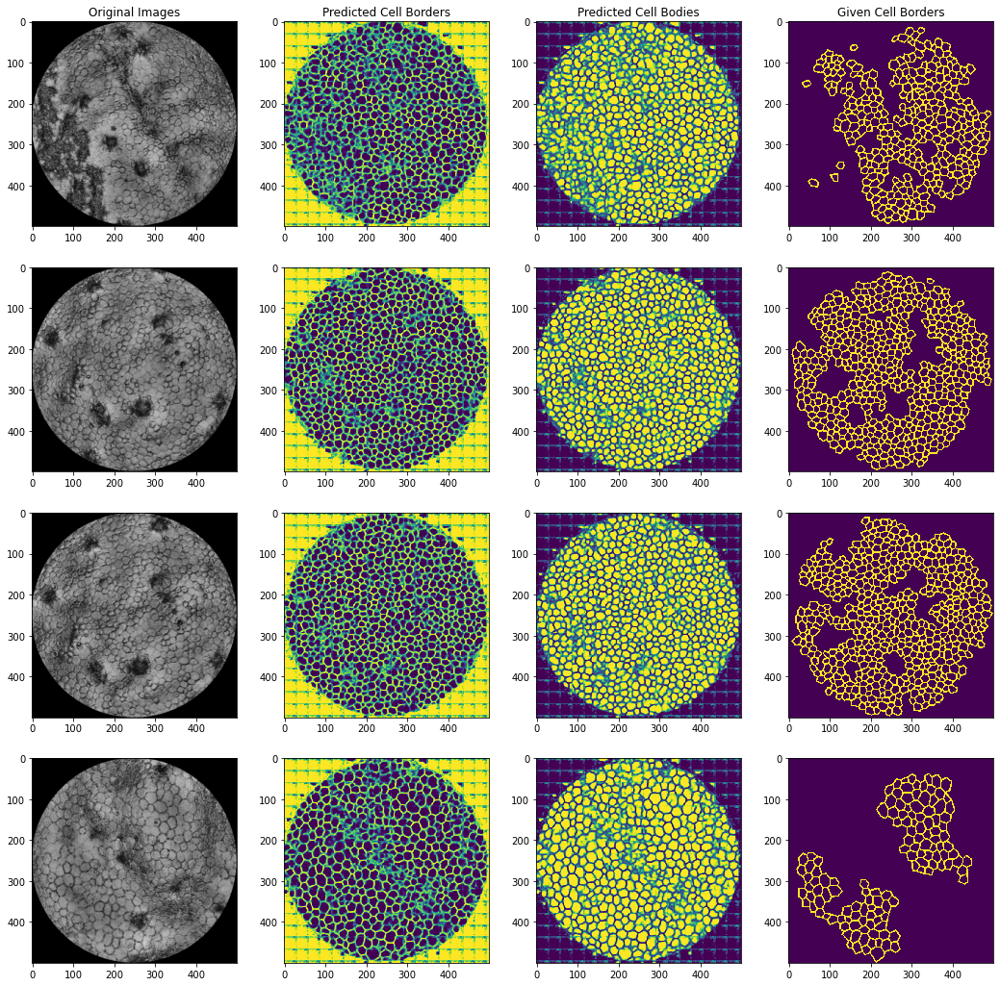

In [223]:
plt.figure(figsize=(18,18))
bad_preds = [16, 18, 19, 43]
for i in range(4):
    r_int = bad_preds[i]
    plt.subplot(4,4,i*4+1)
    if i == 0: plt.title('Original Images')
    plt.imshow(X_test[r_int].reshape(500,500), cmap='gray', vmin=0, vmax=1)
    plt.subplot(4,4,i*4+2)
    if i == 0: plt.title('Predicted Cell Borders')
    plt.imshow(Y_pred[r_int][:,:,0].reshape(500,500), interpolation='nearest')
    plt.subplot(4,4,i*4+3)
    if i == 0: plt.title('Predicted Cell Bodies')
    plt.imshow(Y_pred[r_int][:,:,1].reshape(500,500), interpolation='nearest')
    plt.subplot(4,4,i*4+4)
    if i == 0: plt.title('Given Cell Borders')
    plt.imshow(Y_test[r_int][:,:,0].reshape(500,500), interpolation='nearest')
plt.show()

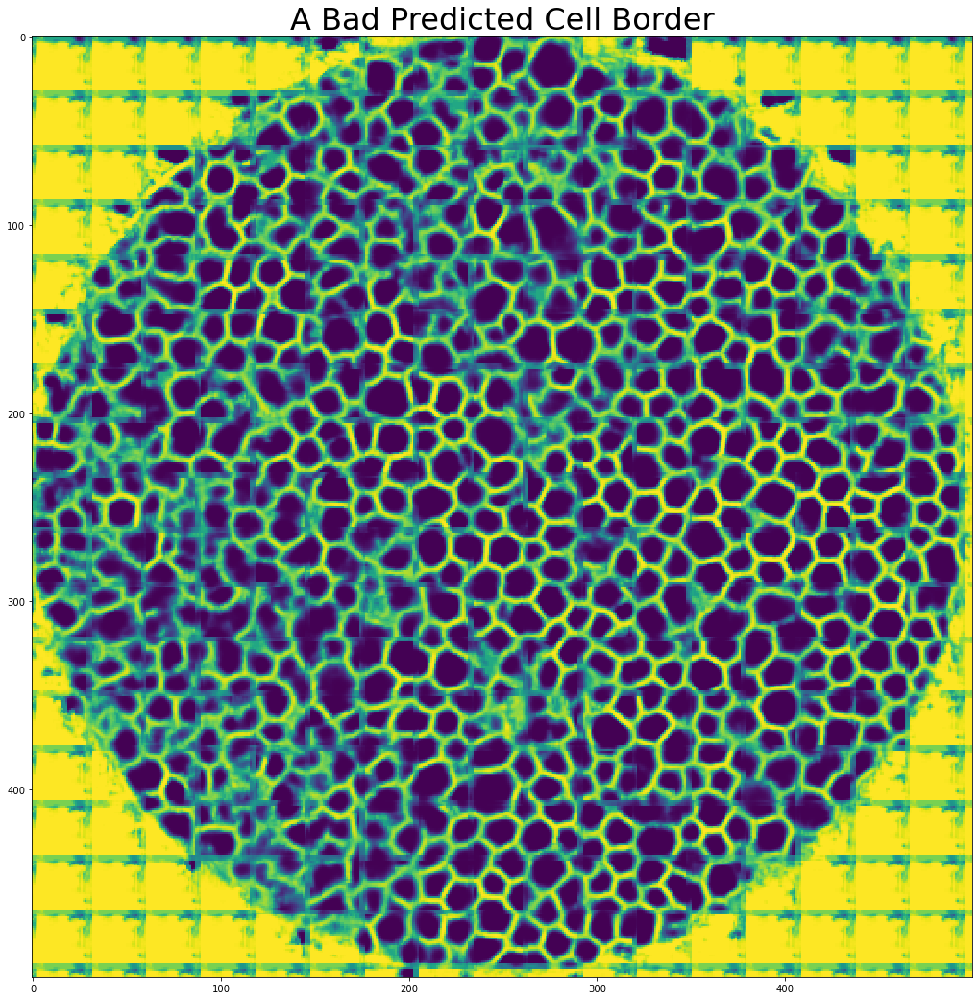

In [224]:
plt.figure(figsize=(18,18))
plt.title('A Bad Predicted Cell Border', fontsize=32)
plt.imshow(Y_pred[16][:,:,0].reshape(500,500), interpolation='nearest')
plt.show()

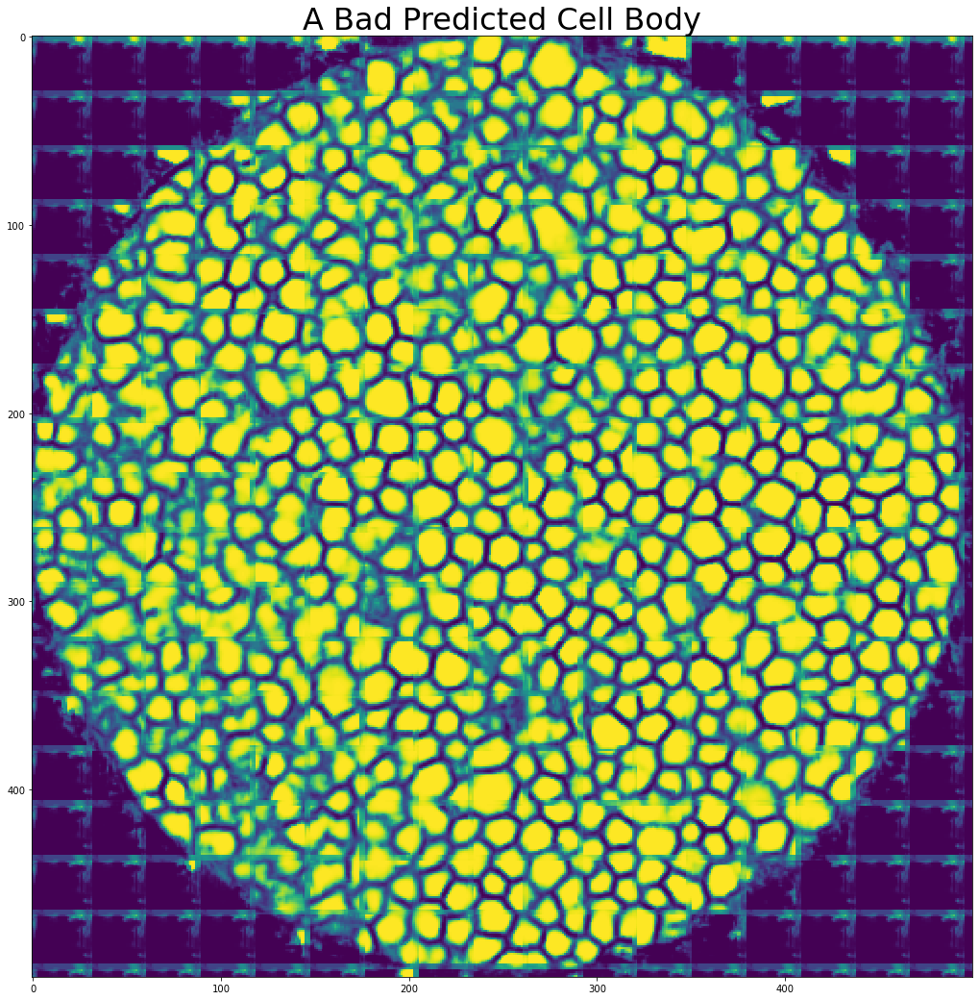

In [225]:
plt.figure(figsize=(18,18))
plt.title('A Bad Predicted Cell Body', fontsize=32)
plt.imshow(Y_pred[16][:,:,1].reshape(500,500), interpolation='nearest')
plt.show()

## (iii) Post Processed Images (3.4 Applied):

### Note: Please look at the visualizations before running this cell in sequential manner as the values plotted here were selected manually after looking at various images to choose the visually good and bad segmentations.

### Good Post Processing:

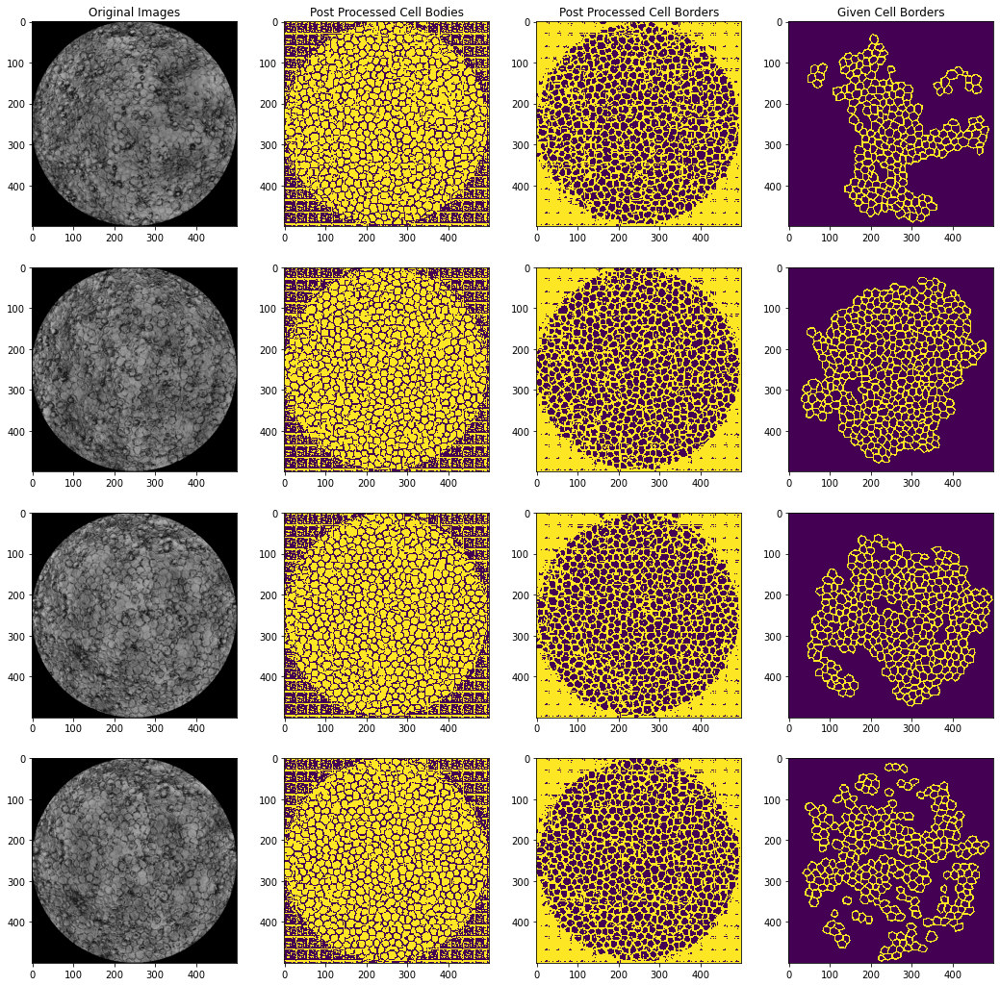

In [226]:
plt.figure(figsize=(18,18))
good_posts = [22, 26, 38, 39]
for i in range(4):
    r_int = good_posts[i]
    plt.subplot(4,4,i*4+1)
    if i == 0: plt.title('Original Images')
    plt.imshow(X_test[r_int].reshape(500,500), cmap='gray', vmin=0, vmax=1)
    plt.subplot(4,4,i*4+2)
    if i == 0: plt.title('Post Processed Cell Bodies')
    plt.imshow(Y_post[r_int][:,:,1].reshape(500,500), interpolation='nearest')
    plt.subplot(4,4,i*4+3)
    if i == 0: plt.title('Post Processed Cell Borders')
    plt.imshow(Y_post[r_int][:,:,0].reshape(500,500), interpolation='nearest')
    plt.subplot(4,4,i*4+4)
    if i == 0: plt.title('Given Cell Borders')
    plt.imshow(Y_test[r_int][:,:,0].reshape(500,500), interpolation='nearest')
plt.show()

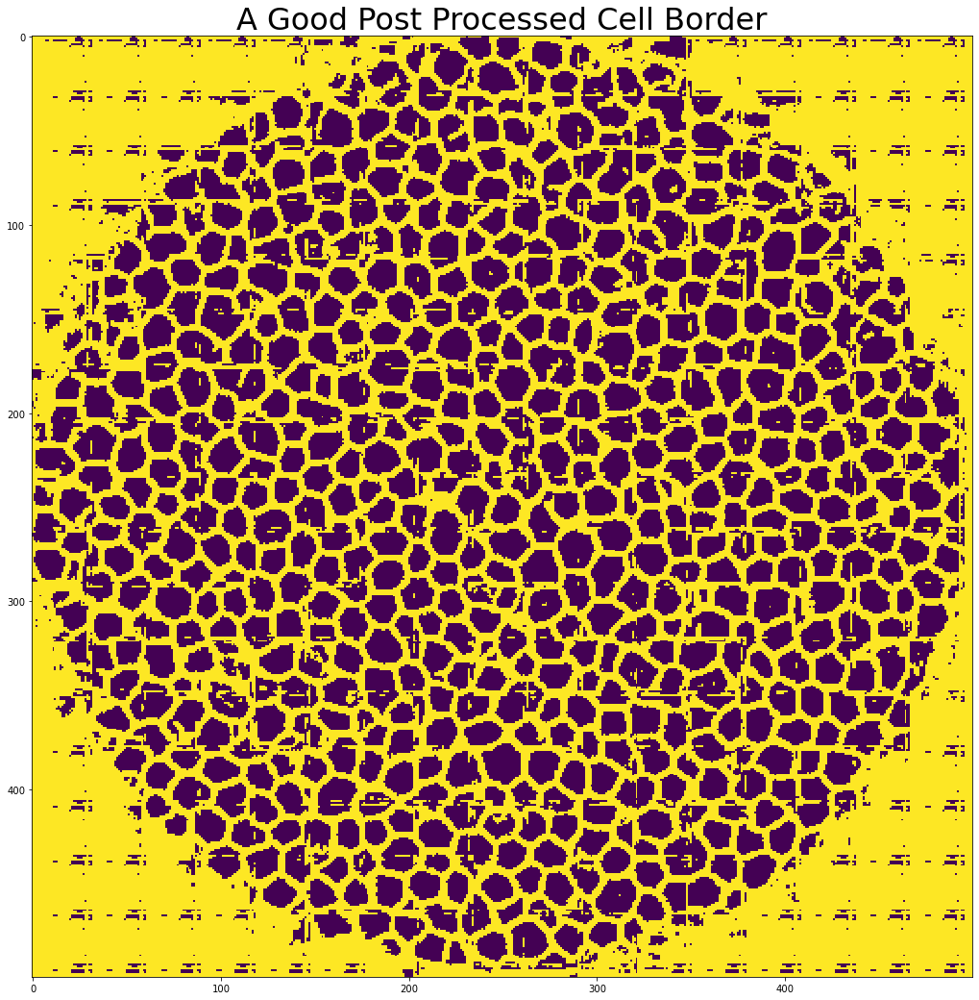

In [227]:
plt.figure(figsize=(18,18))
plt.title('A Good Post Processed Cell Border', fontsize=32)
plt.imshow(Y_post[39][:,:,0].reshape(500,500), interpolation='nearest')
plt.show()

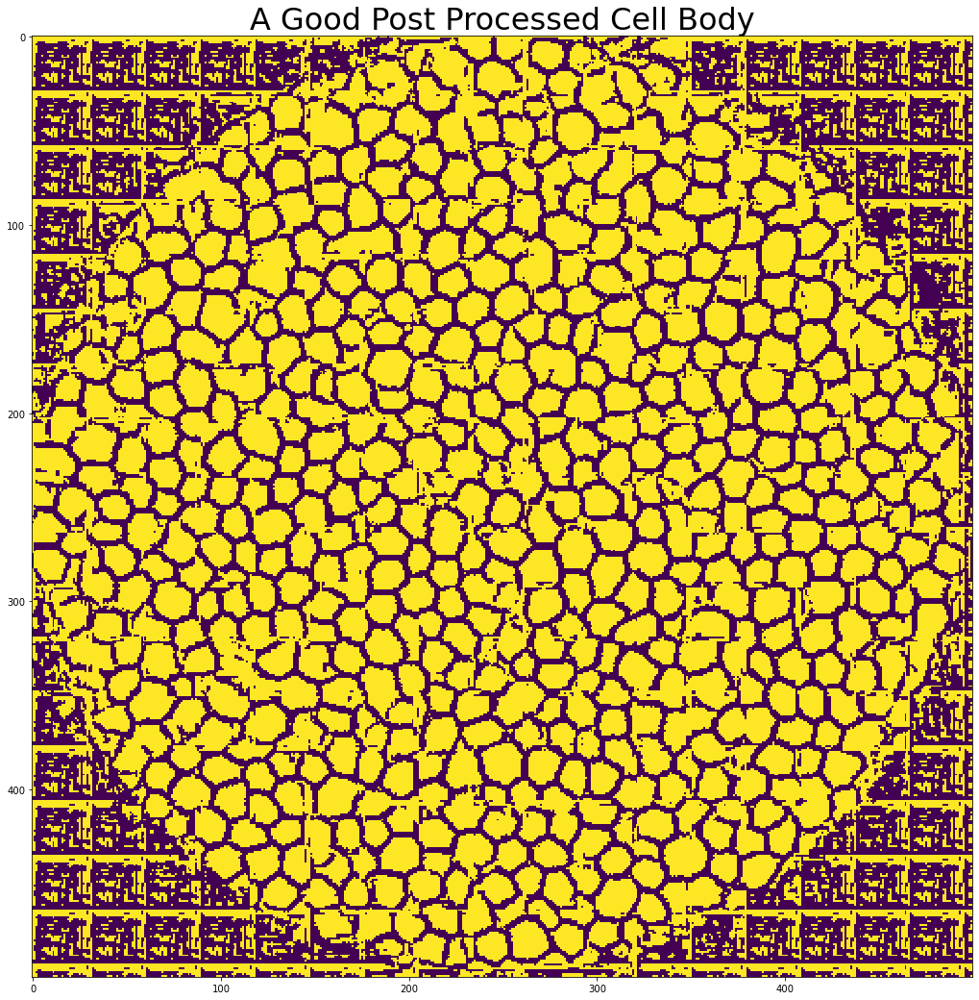

In [228]:
plt.figure(figsize=(18,18))
plt.title('A Good Post Processed Cell Body', fontsize=32)
plt.imshow(Y_post[39][:,:,1].reshape(500,500), interpolation='nearest')
plt.show()

### Bad Post Processing:

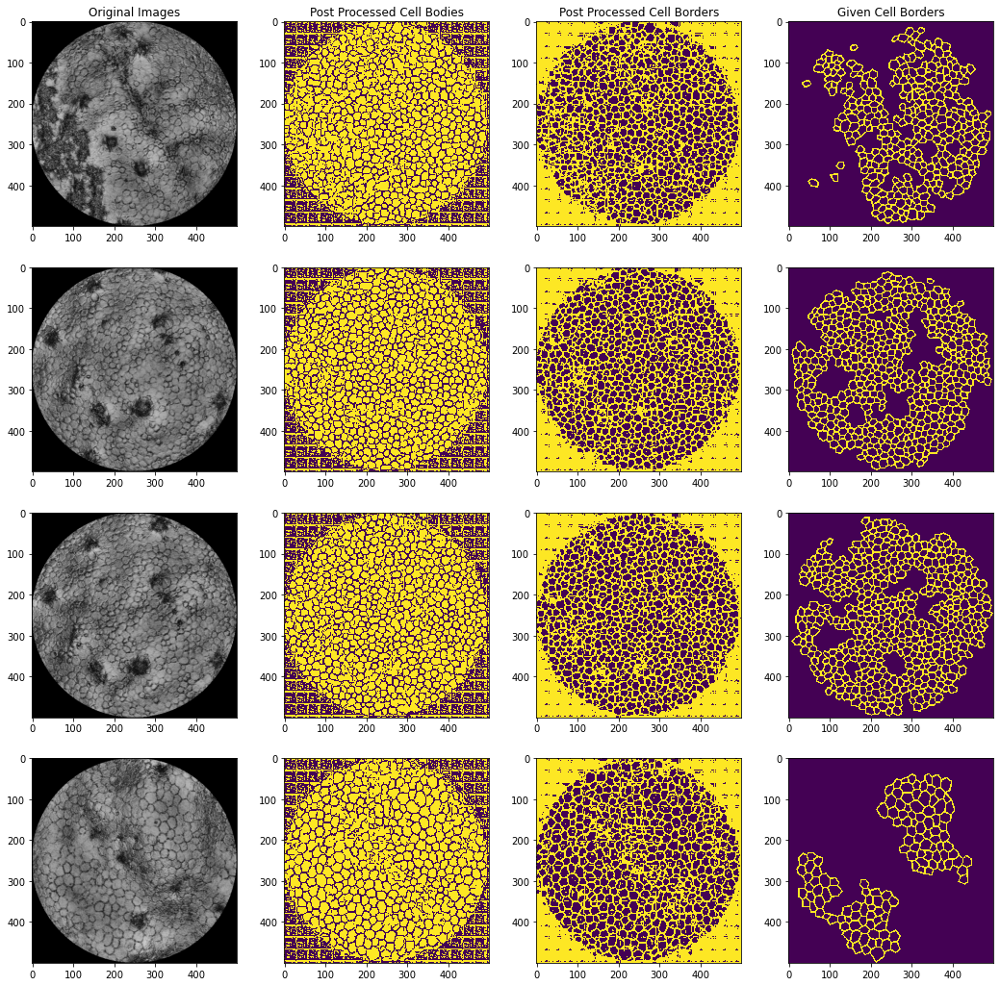

In [229]:
plt.figure(figsize=(18,18))
bad_posts = [16, 18, 19, 43]
for i in range(4):
    r_int = bad_posts[i]
    plt.subplot(4,4,i*4+1)
    if i == 0: plt.title('Original Images')
    plt.imshow(X_test[r_int].reshape(500,500), cmap='gray', vmin=0, vmax=1)
    plt.subplot(4,4,i*4+2)
    if i == 0: plt.title('Post Processed Cell Bodies')
    plt.imshow(Y_post[r_int][:,:,1].reshape(500,500), interpolation='nearest')
    plt.subplot(4,4,i*4+3)
    if i == 0: plt.title('Post Processed Cell Borders')
    plt.imshow(Y_post[r_int][:,:,0].reshape(500,500), interpolation='nearest')
    plt.subplot(4,4,i*4+4)
    if i == 0: plt.title('Given Cell Borders')
    plt.imshow(Y_test[r_int][:,:,0].reshape(500,500), interpolation='nearest')
plt.show()

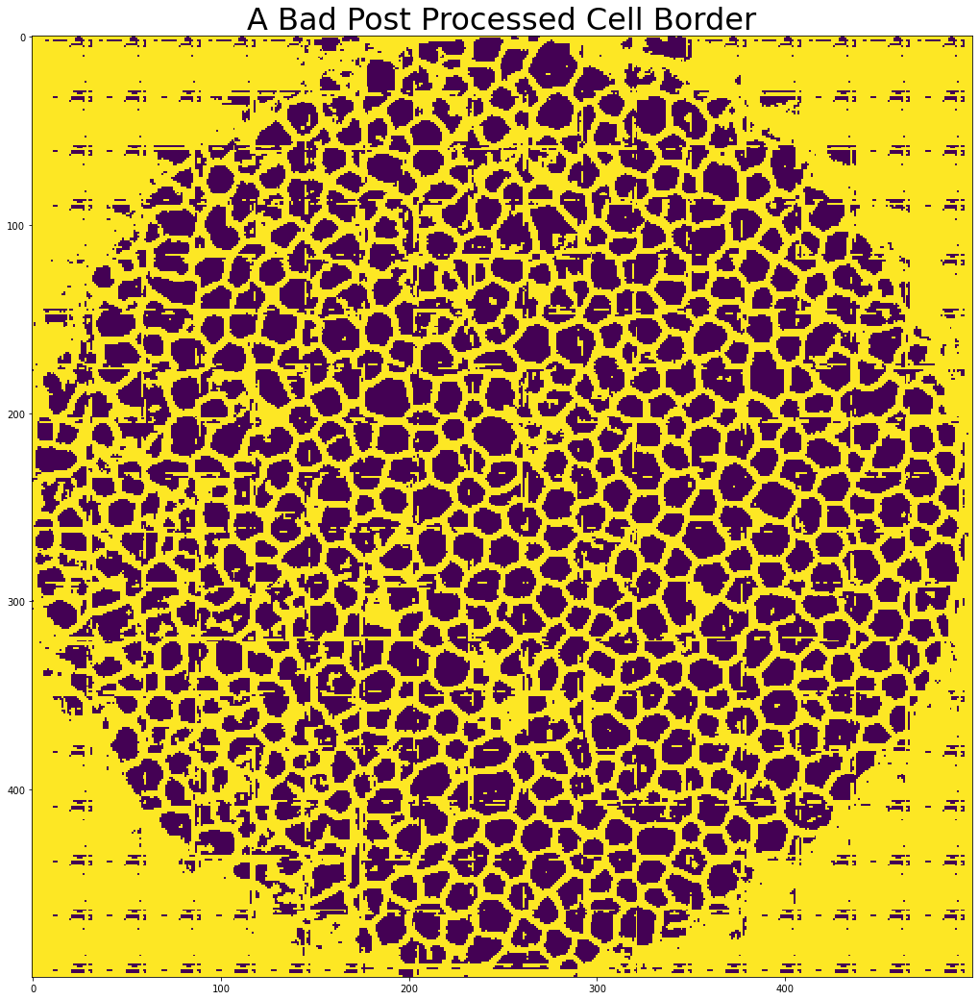

In [230]:
plt.figure(figsize=(18,18))
plt.title('A Bad Post Processed Cell Border', fontsize=32)
plt.imshow(Y_post[16][:,:,0].reshape(500,500), interpolation='nearest')
plt.show()

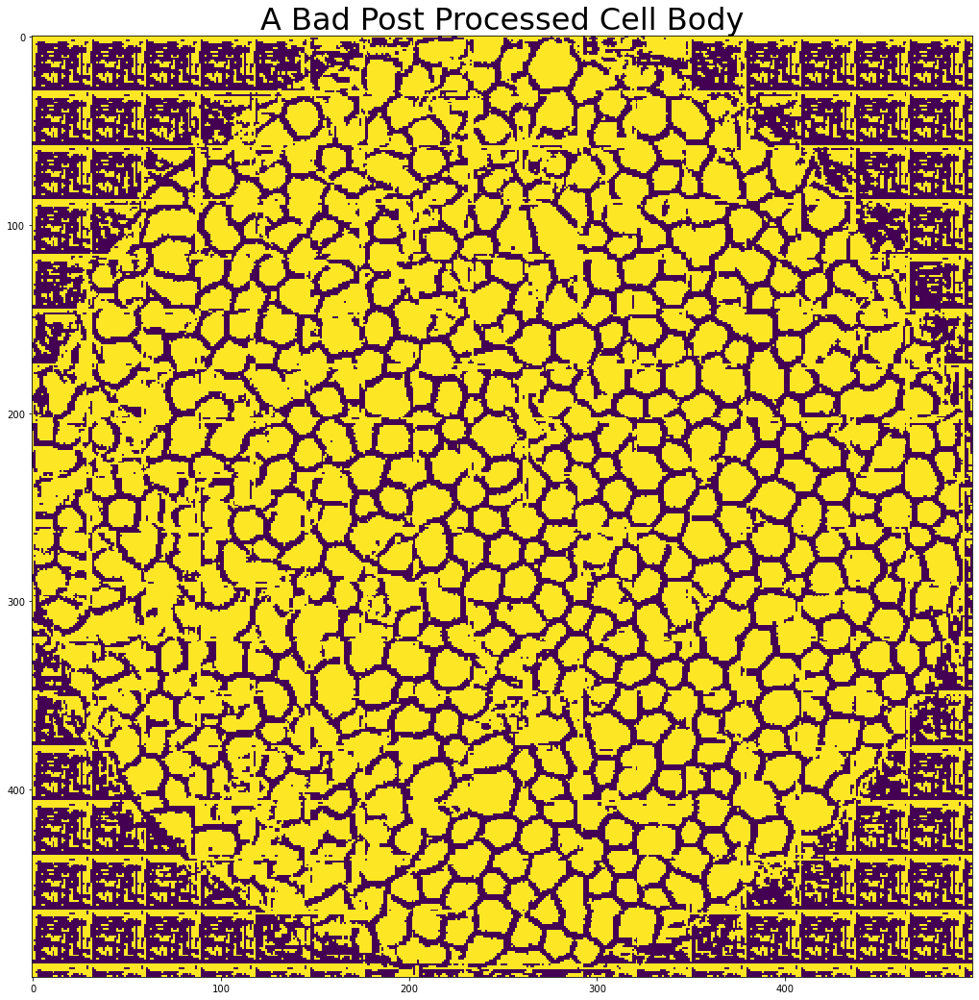

In [231]:
plt.figure(figsize=(18,18))
plt.title('A Bad Post Processed Cell Body', fontsize=32)
plt.imshow(Y_post[16][:,:,1].reshape(500,500), interpolation='nearest')
plt.show()

# F) Calculating ROC & AUC of model

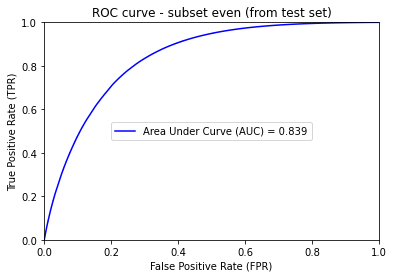

In [232]:
# On Testing Set

Y_pred_patches = model.predict(X_test_patches)
fpr, tpr, threshold = metrics.roc_curve(Y_test_patches[:,:,:,0].flatten(), Y_pred_patches[:,:,:,0].flatten())
roc_auc = metrics.auc(fpr, tpr)

plt.title('ROC curve - subset even (from test set)')
plt.plot(fpr, tpr, 'b', label = 'Area Under Curve (AUC) = %0.3f' % roc_auc)
plt.legend(loc = 'center')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate (TPR)')
plt.xlabel('False Positive Rate (FPR)')
plt.show()

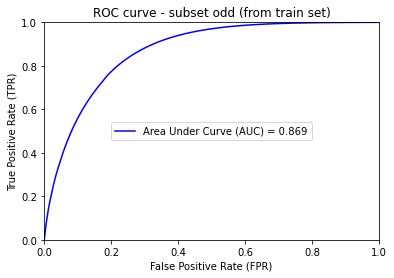

In [233]:
# On Training Set

Y_pred_patches = model.predict(X_train)
fpr, tpr, threshold = metrics.roc_curve(Y_train[:,:,:,0].flatten(), Y_pred_patches[:,:,:,0].flatten())
roc_auc = metrics.auc(fpr, tpr)

plt.title('ROC curve - subset odd (from train set)')
plt.plot(fpr, tpr, 'b', label = 'Area Under Curve (AUC) = %0.3f' % roc_auc)
plt.legend(loc = 'center')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate (TPR)')
plt.xlabel('False Positive Rate (FPR)')
plt.show()

# G) Comparision of Model's performance with results in the paper:

- The ROC and AUC of the model is calculated by using the sklearn learn functions. Here we input Predicted data and given labels and in-turn we get the ROC and AUC of the model. ROC is a probability curve and AUC represents the degree or measure of separability. It tells how much the model is capable of distinguishing between classes. We use this to distinguish the difference between predicted and actual values. comparing the ROC and AUC values we get good values but not as good as the paper. As in paper the values were close to (0.919) for odd and (0.927) for even. Whereas we got around (0.869) for odd and (0.839) for even. Which is close to the paper but not as good.<br><br>

- In the above table we compared the AUC values that we got against the values that were estimated in the paper. From this as I mentioned earlier, we can estimate the difference between predicted values and actual values. Apart from that we got around 79.9 percent training accuracy and the loss of training (loss on the training set) was around 0.44(at the start of training (after first epoch)) and it improved to around 0.2637 at the end of the training (after 150 epochs). Apart from this the validation accuracy on the test set was around 72.6 percent and the loss improved from around (0.719 (at the start of the first epoch)) to (0.4519(at the end of 150 epochs)).In the above figures we can see that the curve is leaned on the left side and that should the ideal output and we have seen that in the paper and in our implementation, the curve seems to be the same. But yeah the AUC values are slightly different.<br><br>

- We were able to visually infer that the prediction and the 3.4 postprocessing method in the paper gave very similar outputs and most of them found the cell boundaries and the cell bodies accurately as shown in the section E] (in our implementation). Hence, we have successfully predicted the outputs but the AUC values are a bit less compared to the paper and that can be due to a different image size that was used in the paper(575x575).